In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import re
import shutil
import pandas as pd
import scipy.stats

import exdir
import expipe
from distutils.dir_util import copy_tree
import septum_mec
import spatial_maps as sp
import head_direction.head as head
import septum_mec.analysis.data_processing as dp
import septum_mec.analysis.registration
from septum_mec.analysis.plotting import violinplot

from spike_statistics.core import permutation_resampling

from tqdm import tqdm_notebook as tqdm
from tqdm._tqdm_notebook import tqdm_notebook
tqdm_notebook.pandas()

13:04:51 [I] klustakwik KlustaKwik2 version 0.2.6
/home/mikkel/.virtualenvs/expipe/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [3]:
project_path = dp.project_path()
project = expipe.get_project(project_path)
actions = project.actions

output_path = pathlib.Path("output") / "longitudinal-comparisons-gridcells"
(output_path / "statistics").mkdir(exist_ok=True, parents=True)
(output_path / "figures").mkdir(exist_ok=True, parents=True)

# Load cell statistics and shuffling quantiles

In [4]:
statistics_action = actions['calculate-statistics']
identification_action = actions['identify-neurons']
sessions = pd.read_csv(identification_action.data_path('sessions'))
units = pd.read_csv(identification_action.data_path('units'))
session_units = pd.merge(sessions, units, on='action')
statistics_results = pd.read_csv(statistics_action.data_path('results'))
statistics = pd.merge(session_units, statistics_results, how='left')
statistics.head()

,action,baseline,entity,frequency,i,ii,session,stim_location,stimulated,tag,...,burst_event_ratio,bursty_spike_ratio,gridness,border_score,information_rate,information_specificity,head_mean_ang,head_mean_vec_len,spacing,orientation
0,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.398230,0.678064,-0.466923,0.029328,1.009215,0.317256,5.438033,0.040874,0.628784,20.224859
1,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.138014,0.263173,-0.666792,0.308146,0.192524,0.033447,1.951740,0.017289,0.789388,27.897271
2,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.373986,0.659259,-0.572566,0.143252,4.745836,0.393704,4.439721,0.124731,0.555402,28.810794
3,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.087413,0.179245,-0.437492,0.268948,0.157394,0.073553,6.215195,0.101911,0.492250,9.462322
4,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,0.248771,0.463596,-0.085938,0.218744,0.519153,0.032683,1.531481,0.053810,0.559905,0.000000


In [5]:
statistics['unit_day'] = statistics.apply(lambda x: str(x.unit_idnum) + '_' + x.action.split('-')[1], axis=1)

In [6]:
stim_response_action = actions['stimulus-response']
stim_response_results = pd.read_csv(stim_response_action.data_path('results'))

In [7]:
statistics = pd.merge(statistics, stim_response_results, how='left')

In [8]:
print('N cells:',statistics.shape[0])

N cells: 1284


In [9]:
shuffling = actions['shuffling']
quantiles_95 = pd.read_csv(shuffling.data_path('quantiles_95'))
quantiles_95.head()

,border_score,gridness,head_mean_ang,head_mean_vec_len,information_rate,speed_score,action,channel_group,unit_name
0,0.348023,0.275109,3.012689,0.086792,0.707197,0.149071,1833-010719-1,0.0,127.0
1,0.362380,0.166475,3.133138,0.037271,0.482486,0.132212,1833-010719-1,0.0,161.0
2,0.367498,0.266865,5.586395,0.182843,0.271188,0.062821,1833-010719-1,0.0,191.0
3,0.331942,0.312155,5.955767,0.090786,0.354018,0.052009,1833-010719-1,0.0,223.0
4,0.325842,0.180495,5.262721,0.103584,0.210427,0.094041,1833-010719-1,0.0,225.0


In [10]:
action_columns = ['action', 'channel_group', 'unit_name']
data = pd.merge(statistics, quantiles_95, on=action_columns, suffixes=("", "_threshold"))

data['specificity'] = np.log10(data['in_field_mean_rate'] / data['out_field_mean_rate'])

data.head()

,action,baseline,entity,frequency,i,ii,session,stim_location,stimulated,tag,...,p_e_peak,t_i_peak,p_i_peak,border_score_threshold,gridness_threshold,head_mean_ang_threshold,head_mean_vec_len_threshold,information_rate_threshold,speed_score_threshold,specificity
0,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.332548,0.229073,6.029431,0.205362,1.115825,0.066736,0.451741
1,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.354830,0.089333,6.120055,0.073566,0.223237,0.052594,0.098517
2,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.264610,-0.121081,5.759406,0.150827,4.964984,0.027120,0.400770
3,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.344280,0.215829,6.033364,0.110495,0.239996,0.054074,0.269461
4,1849-060319-3,True,1849,NaN,False,True,3,NaN,False,baseline ii,...,NaN,NaN,NaN,0.342799,0.218967,5.768170,0.054762,0.524990,0.144702,0.133410


# Statistics about all cell-sessions

In [11]:
data.groupby('stimulated').count()['action']

stimulated
False    624
True     660
Name: action, dtype: int64

# Find all cells with gridness above threshold

In [12]:
query = (
    'gridness > gridness_threshold and '
    'information_rate > information_rate_threshold and '
    'gridness > .2 and '
    'average_rate < 25'
)
sessions_above_threshold = data.query(query)
print("Number of sessions above threshold", len(sessions_above_threshold))
print("Number of animals", len(sessions_above_threshold.groupby(['entity'])))

Number of sessions above threshold 194
Number of animals 4


## select neurons that have been characterized as a grid cell on the same day

In [13]:
once_a_gridcell = statistics[statistics.unit_day.isin(sessions_above_threshold.unit_day.values)]

In [14]:
print("Number of gridcells", once_a_gridcell.unit_idnum.nunique())
print("Number of gridcell recordings", len(once_a_gridcell))
print("Number of animals", len(once_a_gridcell.groupby(['entity'])))

Number of gridcells 139
Number of gridcell recordings 231
Number of animals 4


# divide into stim not stim

In [15]:
baseline_i = once_a_gridcell.query('baseline and Hz11')
stimulated_11 = once_a_gridcell.query('stimulated and frequency==11 and stim_location=="ms"')

baseline_ii = once_a_gridcell.query('baseline and Hz30')
stimulated_30 = once_a_gridcell.query('stimulated and frequency==30 and stim_location=="ms"')

print("Number of gridcells in baseline i sessions", len(baseline_i))
print("Number of gridcells in stimulated 11Hz ms sessions", len(stimulated_11))

print("Number of gridcells in baseline ii sessions", len(baseline_ii))
print("Number of gridcells in stimulated 30Hz ms sessions", len(stimulated_30))

Number of gridcells in baseline i sessions 66
Number of gridcells in stimulated 11Hz ms sessions 61
Number of gridcells in baseline ii sessions 56
Number of gridcells in stimulated 30Hz ms sessions 40


# Plotting

In [16]:
max_speed = 1, # m/s only used for speed score
min_speed = 0.02, # m/s only used for speed score
position_sampling_rate = 100 # for interpolation
position_low_pass_frequency = 6 # for low pass filtering of position

box_size = [1.0, 1.0]
bin_size = 0.02
smoothing_low = 0.03
smoothing_high = 0.06

stim_mask = True
baseline_duration = 600

In [17]:
data_loader = dp.Data(
    position_sampling_rate=position_sampling_rate, 
    position_low_pass_frequency=position_low_pass_frequency,
    box_size=box_size, bin_size=bin_size, 
    stim_mask=stim_mask, baseline_duration=baseline_duration
)

In [21]:
results_corr = [[], [], []]
results_gridness = [[], [], []]
results_maxrate = [[], [], []]
results_avgrate = [[], [], []]
results_unit_name = [[], [], []]
results_unit_id = [[], [], []]
results_id_map = {}
for nid, unit_sessions in once_a_gridcell.groupby('unit_id'):
    base_i = unit_sessions.query("baseline and Hz11")
    base_ii = unit_sessions.query("baseline and Hz30")
    stim_i = unit_sessions.query("frequency==11")
    stim_ii = unit_sessions.query("frequency==30")
    dfs = [(base_i, base_ii), (base_i, stim_i), (base_ii, stim_ii)]
    for i, pair in enumerate(dfs):
        for (_, row_1), (_, row_2) in zip(pair[0].iterrows(), pair[1].iterrows()):
            rate_map_1 = data_loader.rate_map(
                row_1['action'], row_1['channel_group'], row_1['unit_name'], smoothing_low)
            rate_map_2 = data_loader.rate_map(
                row_2['action'], row_2['channel_group'], row_2['unit_name'], smoothing_low)
            results_corr[i].append(np.corrcoef(rate_map_1.ravel(), rate_map_2.ravel())[0,1])
            results_gridness[i].append((row_1.gridness, row_2.gridness))
            results_maxrate[i].append((row_1.max_rate, row_2.max_rate))
            results_avgrate[i].append((row_1.average_rate, row_2.average_rate))
            results_unit_name[i].append((
                f'{row_1.action}_{row_1.channel_group}_{row_1.unit_name}', 
                f'{row_2.action}_{row_2.channel_group}_{row_2.unit_name}'))
            assert row_1.unit_id == row_2.unit_id
            uid = row_2.unit_id
            idnum = row_1.unit_idnum
            results_id_map[uid] = idnum
            results_unit_id[i].append(idnum)

In [22]:
def session_id(row):
    if row.baseline and row.i:
        n = 0
    elif row.stimulated and row.i:
        n = 1
    elif row.baseline and row.ii:
        n = 2
    elif row.stimulated and row.ii:
        n = 3
    else:
        raise ValueError('what')
    return n
        
once_a_gridcell['session_id'] = once_a_gridcell.apply(session_id, axis=1)

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [23]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (6, 4), 
    'figure.dpi': 150
})

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


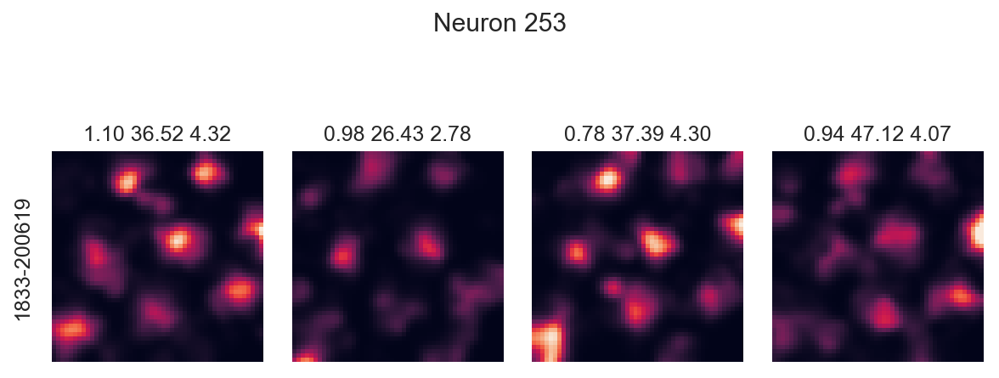

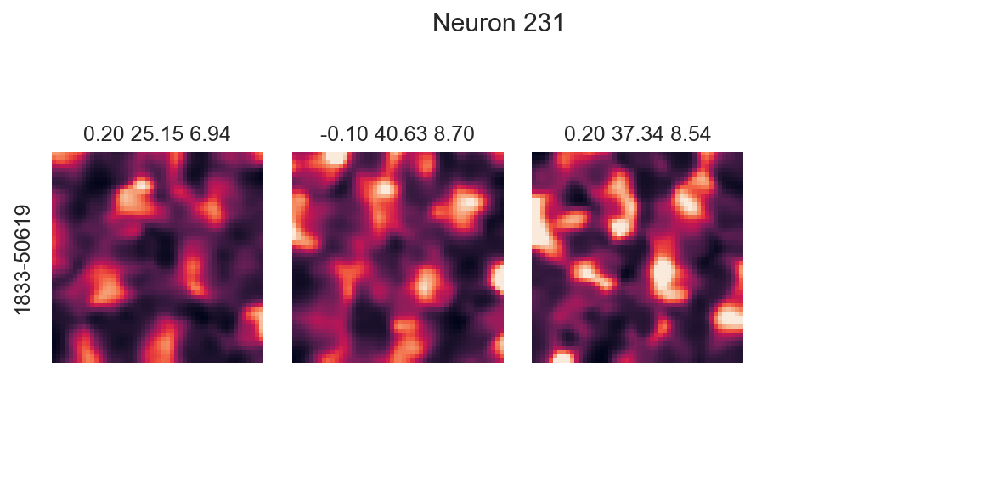

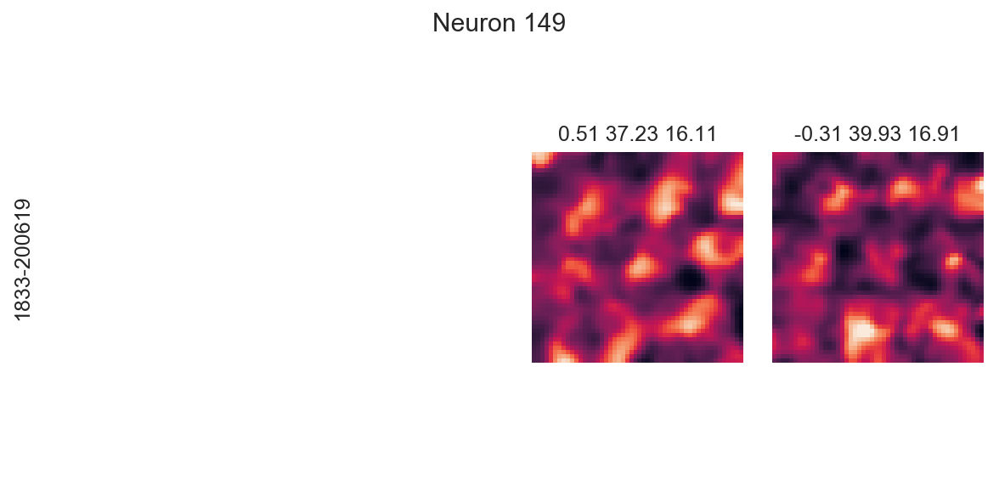

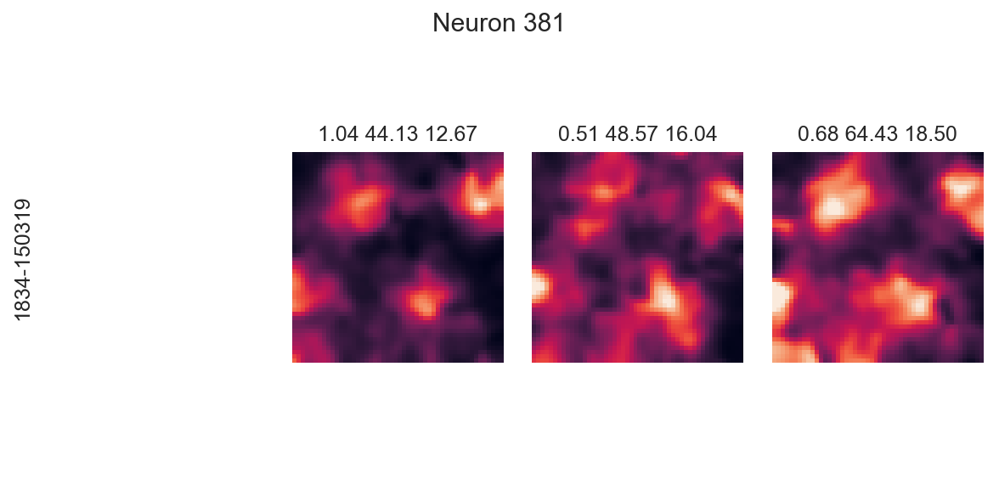

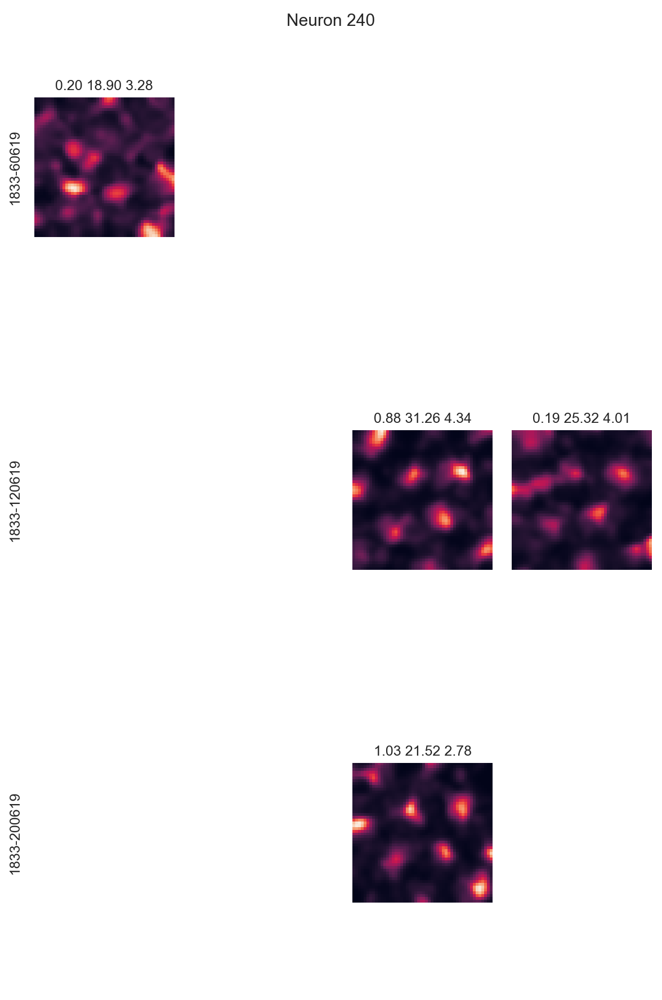

...

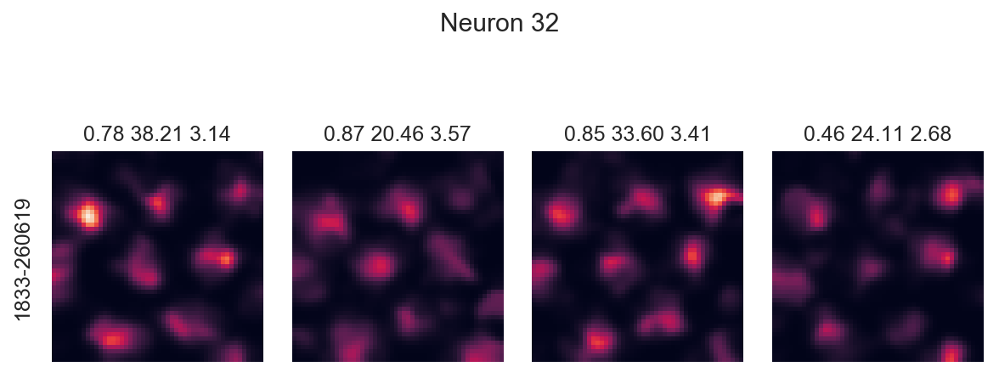

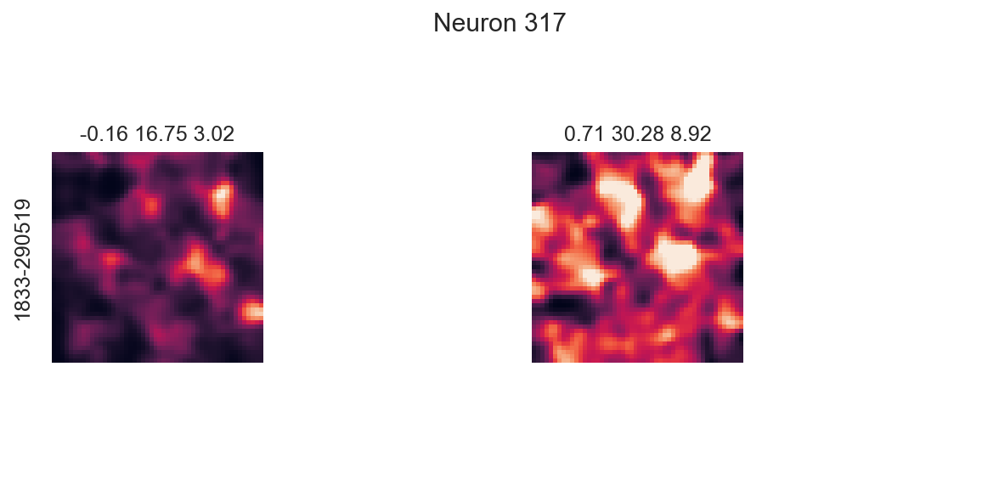

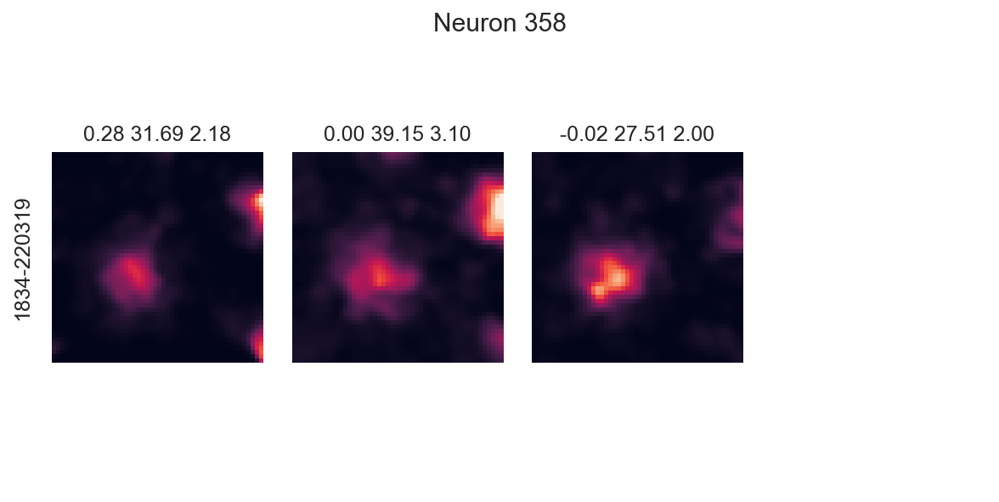

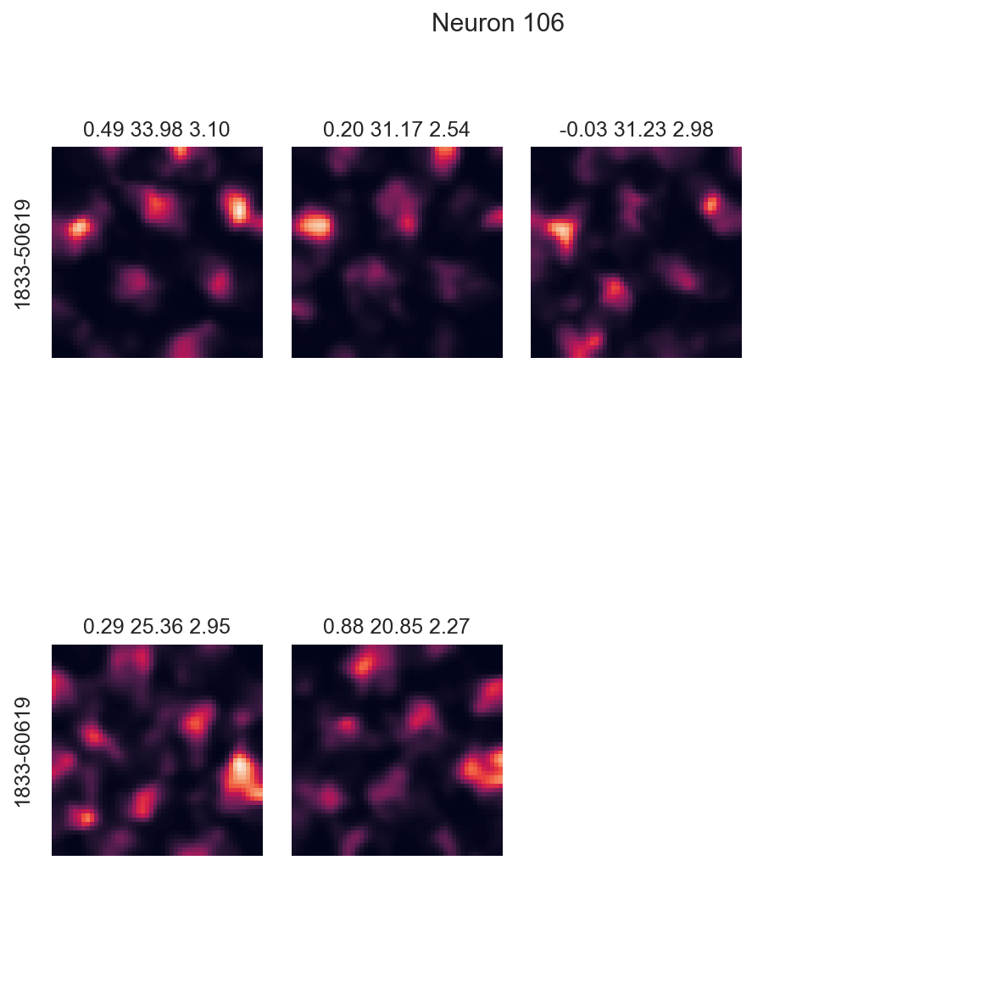

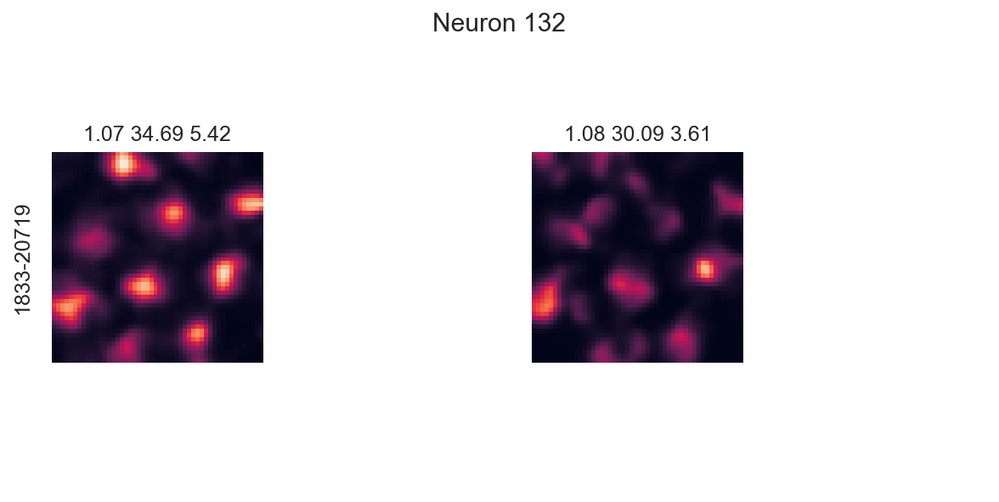

In [24]:
for unit_id, id_num in results_id_map.items():
    sessions = once_a_gridcell.query(f'unit_id=="{unit_id}"')
    n_action = sessions.date.nunique()
    fig, axs = plt.subplots(n_action, 4, sharey=True, sharex=True, figsize=(8, n_action*4))
    sns.despine(left=True, bottom=True)
    fig.suptitle(f'Neuron {id_num}')
    if n_action == 1:
        axs = [axs]
    waxs = None
    for ax, (date, rows) in zip(axs, sessions.groupby('date')):
        rows = rows.sort_values('session')
        entity = rows.iloc[0].entity
        ax[0].set_ylabel(f'{entity}-{date}')
        vmax = None
        for _, row in rows.iterrows():
            action_id = row['action']
            channel_id = row['channel_group']
            unit_name = row['unit_name']
            rate_map = data_loader.rate_map(action_id, channel_id, unit_name, smoothing_low)
            idx = row.session_id
            if vmax is None:
                vmax = rate_map.max()
            ax[idx].imshow(rate_map, origin='lower', vmax=vmax)
            ax[idx].set_title(f'{row.gridness:.2f} {row.max_rate:.2f} {row.average_rate:.2f}')
            ax[idx].set_yticklabels([])
            ax[idx].set_xticklabels([])
    plt.tight_layout()
    fig.savefig(output_path / 'figures' / f'neuron_{id_num}_rate_map.png', bbox_inches='tight')
    fig.savefig(output_path / 'figures' / f'neuron_{id_num}_rate_map.svg', bbox_inches='tight')
            
        # waveforms
#         template = data_loader.template(action_id, channel_id, unit_name)
#         if waxs is None:
#             wfig, waxs = plt.subplots(1, template.data.shape[0], sharey=True, sharex=True)
#         for i, wax in enumerate(waxs):
#             wax.plot(template.data[i,:]) 
#             if i > 0:
#                 ax.set_yticklabels([])

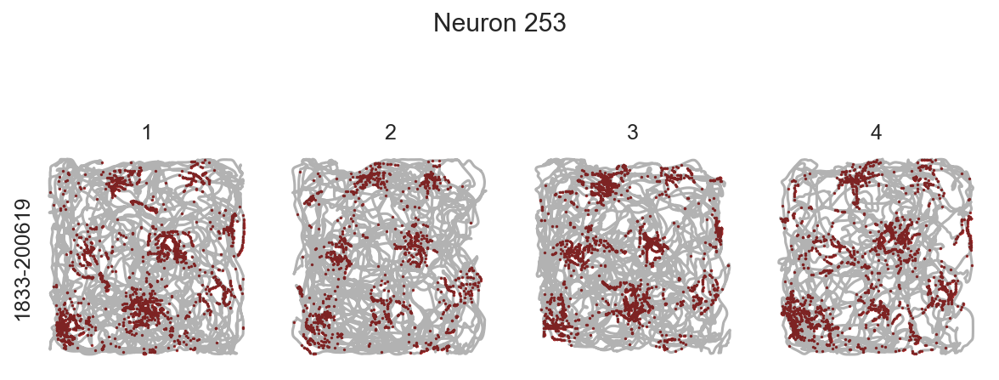

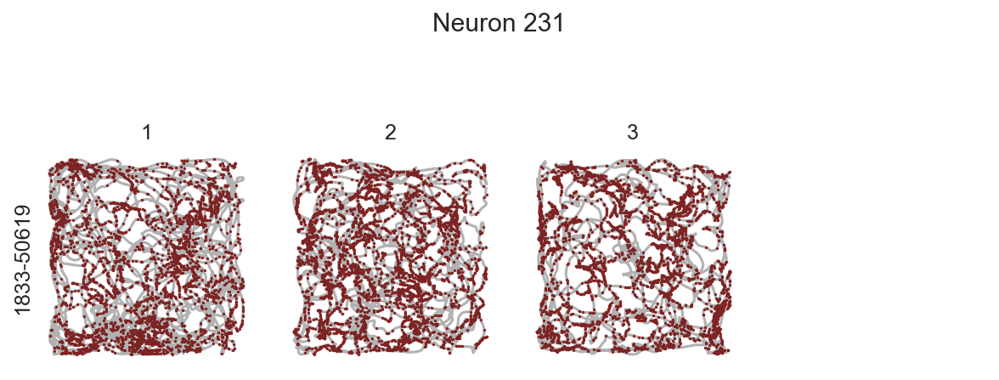

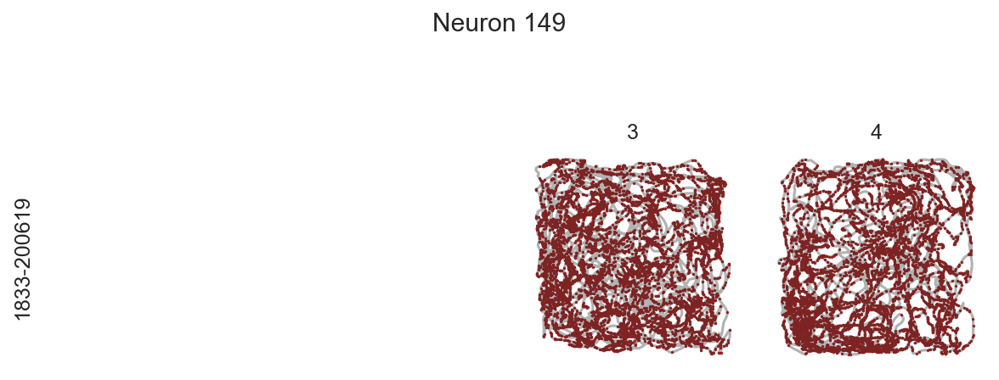

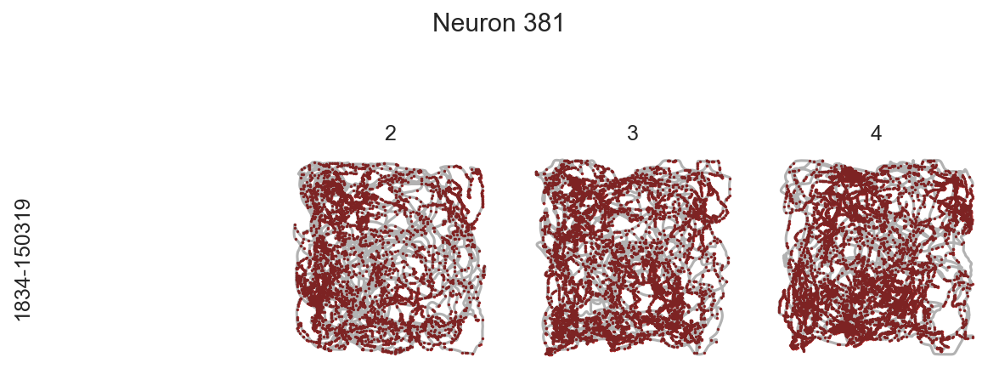

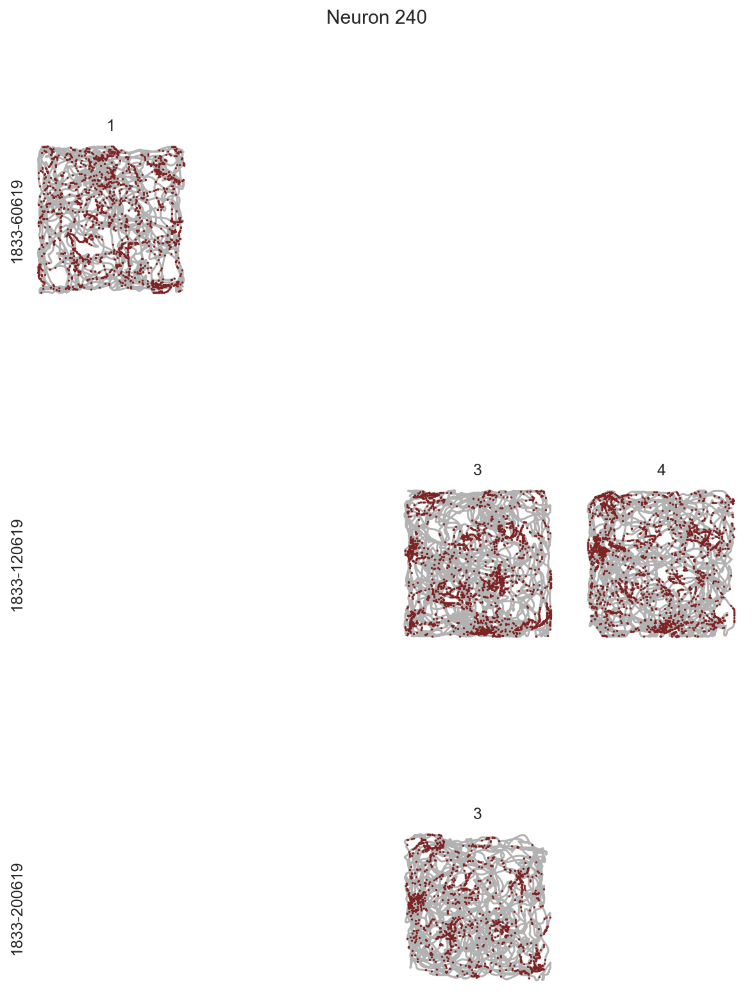

...

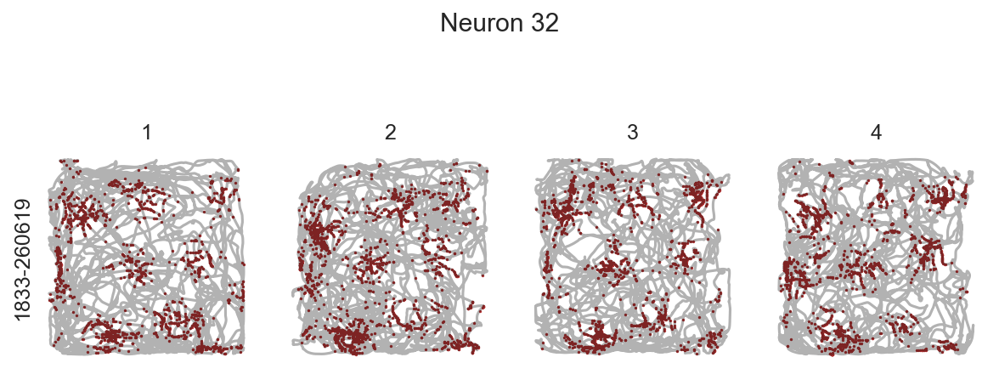

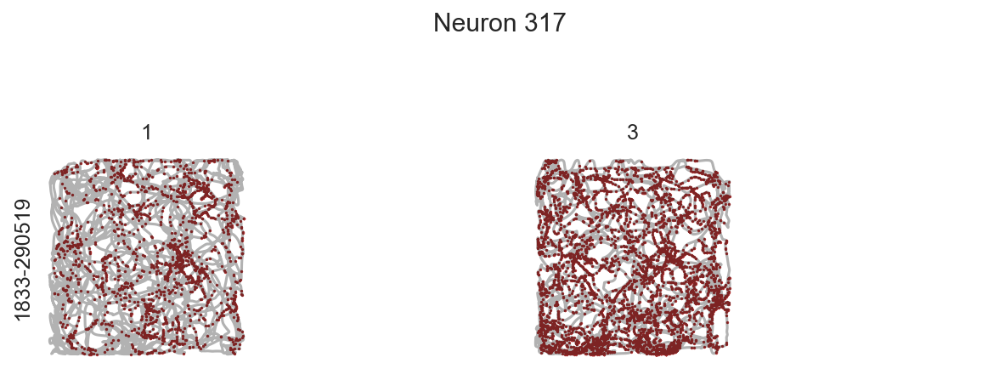

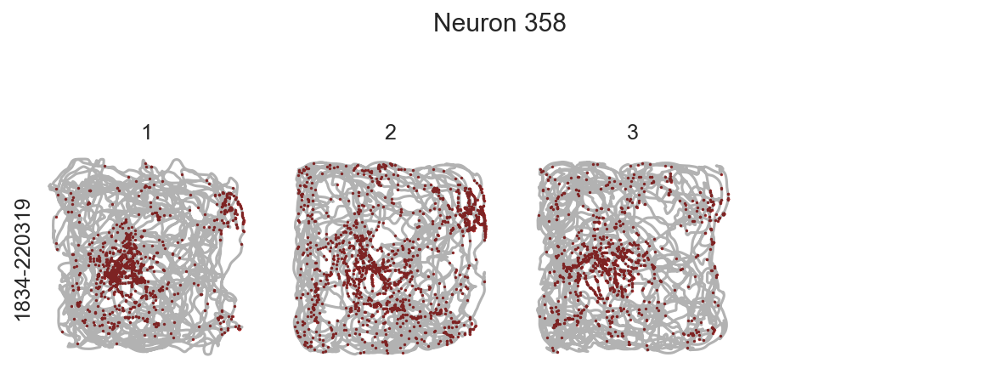

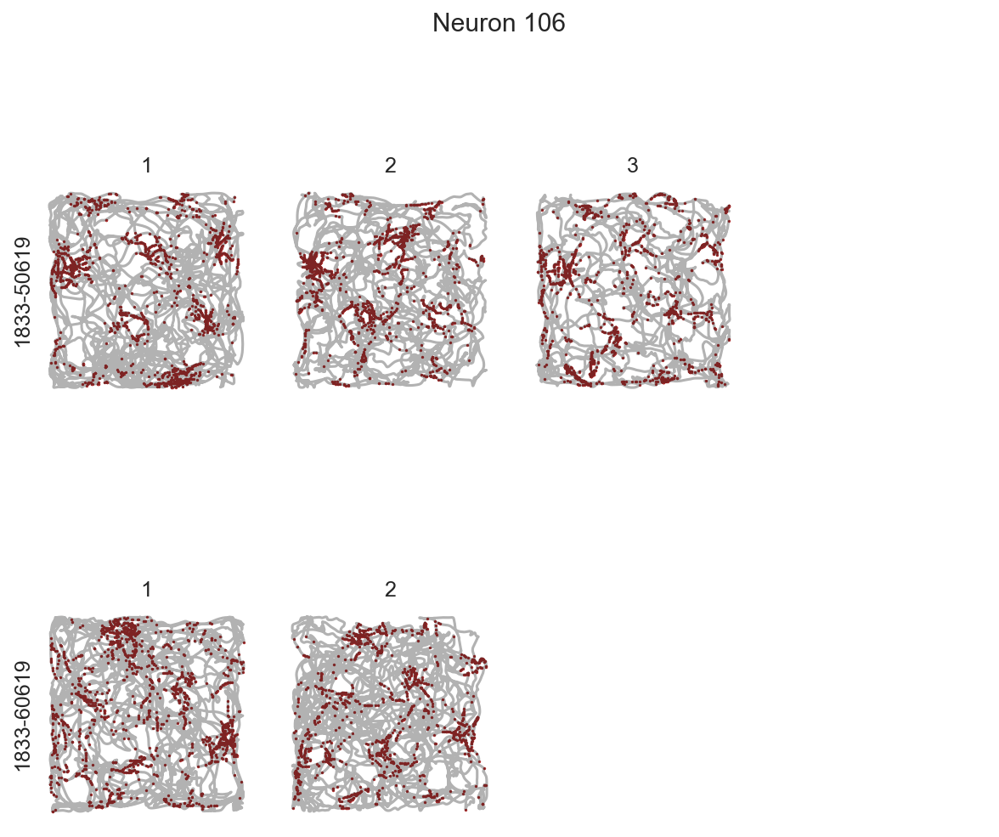

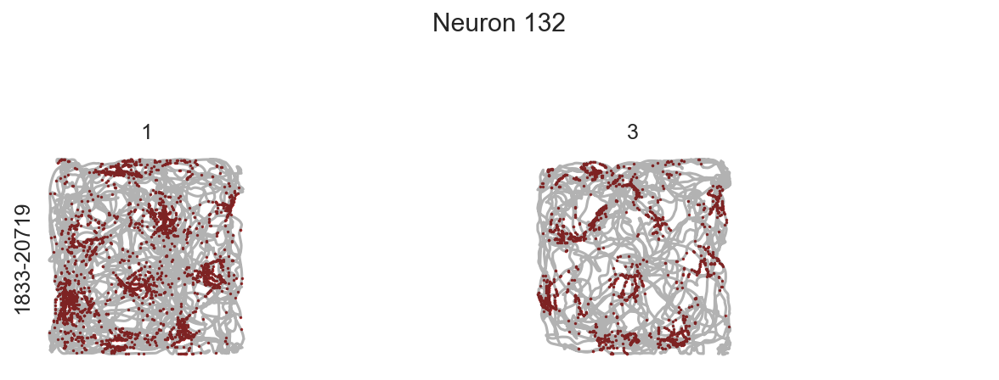

In [25]:
from scipy.interpolate import interp1d


for unit_id, id_num in results_id_map.items():
    sessions = once_a_gridcell.query(f'unit_id=="{unit_id}"')
    n_action = sessions.date.nunique()
    fig, axs = plt.subplots(n_action, 4, sharey=True, sharex=True, figsize=(8, n_action*4))
    sns.despine(left=True, bottom=True)
    fig.suptitle(f'Neuron {id_num}')
    if n_action == 1:
        axs = [axs]
    waxs = None
    for ax, (date, rows) in zip(axs, sessions.groupby('date')):
        entity = rows.iloc[0].entity
        ax[0].set_ylabel(f'{entity}-{date}')
        for _, row in rows.iterrows():
            action_id = row['action']
            channel_id = row['channel_group']
            unit_name = row['unit_name']
            idx = row.session_id
            x, y, t, speed = map(data_loader.tracking(action_id).get, ['x', 'y', 't', 'v'])
            ax[idx].plot(x, y, 'k', alpha=0.3)
            spike_times = data_loader.spike_train(action_id, channel_id, unit_name)
            spike_times = spike_times[(spike_times > min(t)) & (spike_times < max(t))]
            x_spike = interp1d(t, x)(spike_times)
            y_spike = interp1d(t, y)(spike_times)
            ax[idx].set_xticks([])
            ax[idx].set_yticks([])
            ax[idx].scatter(x_spike, y_spike, marker='.', color=(0.7, 0.2, 0.2), s=1.5)
            ax[idx].set_title(f'{row.session}')
            ax[idx].set_yticklabels([])
            ax[idx].set_xticklabels([])
            for a in ax:
                a.set_aspect(1)
    plt.tight_layout()
    fig.savefig(
        output_path / 'figures' / f'neuron_{id_num}_spike_map.png', 
        bbox_inches='tight', transparent=True)
    fig.savefig(
        output_path / 'figures' / f'neuron_{id_num}_spike_map.svg', 
        bbox_inches='tight')

In [26]:
plt.rc('axes', titlesize=12)
plt.rcParams.update({
    'font.size': 12, 
    'figure.figsize': (6, 4), 
    'figure.dpi': 150
})
cmap = ['#1b9e77','#d95f02','#7570b3']

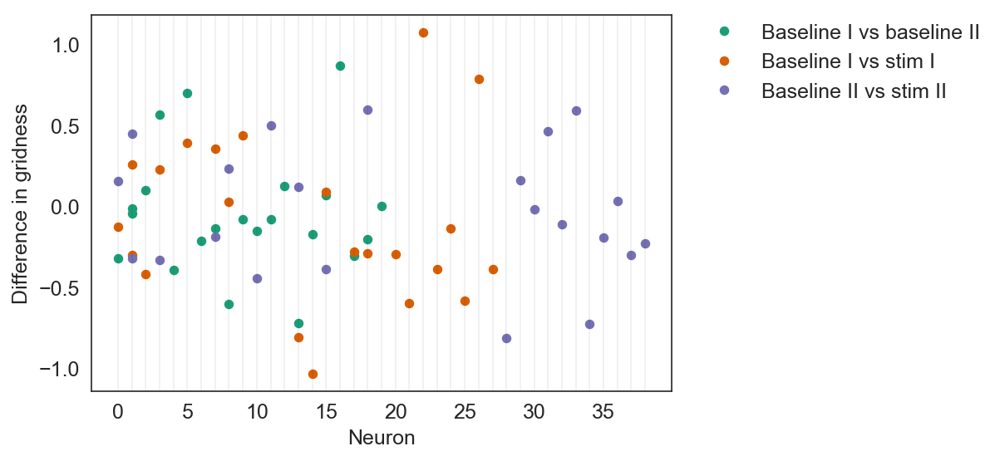

In [27]:
msize = 9
fig = plt.figure()
ticks = []
nuids = {}
n = 0
for i, pairs in enumerate(results_gridness):
    for j, pair in enumerate(pairs):
        nuid = results_unit_id[i][j]
        if nuid not in nuids:
            nuids[nuid] = n
            n += 1
        plt.plot(
            nuids[nuid], np.diff(pair), 
            color=cmap[i], marker='.', ls='none', markersize=msize)
for l in range(n):
    plt.axvline(l, color='k', lw=.1, alpha=.5)

from matplotlib.lines import Line2D

labels = ['Baseline I vs baseline II', 'Baseline I vs stim I', 'Baseline II vs stim II']
custom_lines = [
    Line2D([],[], color=cmap[i], marker='.', ls='none', label=label, markersize=msize) 
    for i, label in enumerate(labels)
]
plt.ylabel('Difference in gridness')
plt.xlabel('Neuron')
plt.legend(handles=custom_lines, bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
fig.savefig(output_path / 'figures' / 'neuron_gridness.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'neuron_gridness.svg', bbox_inches='tight')

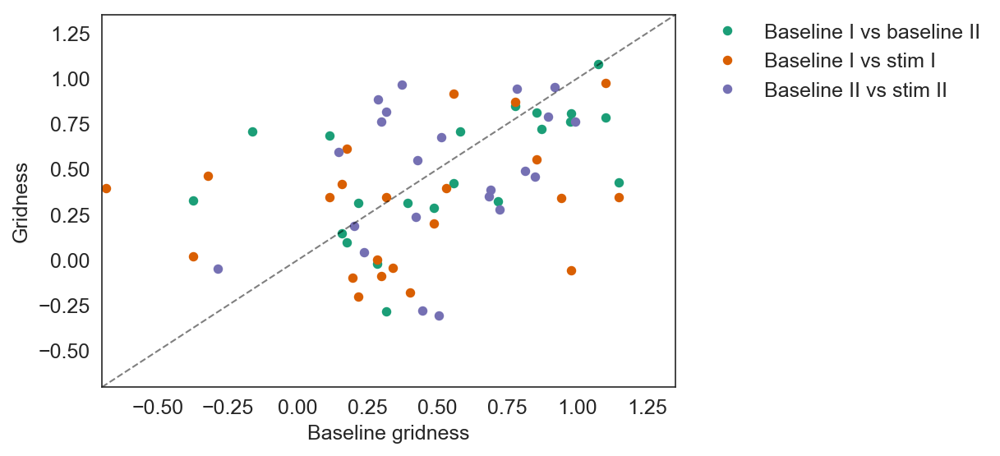

In [28]:
fig = plt.figure()
labels = ['Baseline I vs baseline II', 'Baseline I vs stim I', 'Baseline II vs stim II']
for i, pairs in enumerate(results_gridness):
    for j, pair in enumerate(pairs):
        plt.plot(*pair, color=cmap[i], marker='.', ls='none', markersize=msize)
#     plt.scatter(*np.array(pairs).T, label=labels[i], color=cmap[i])
# plt.legend(bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
custom_lines = [
    Line2D([],[], color=cmap[i], marker='.', ls='none', label=label, markersize=msize) 
    for i, label in enumerate(labels)
]
plt.legend(handles=custom_lines, bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
plt.ylabel('Gridness')
plt.xlabel('Baseline gridness')
lim = [-.7, 1.35]
plt.ylim(lim)
plt.xlim(lim)
plt.plot(lim, lim, '--k', alpha=.5, lw=1)
fig.savefig(output_path / 'figures' / 'baseline_gridness_vs_other.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'baseline_gridness_vs_other.svg', bbox_inches='tight')

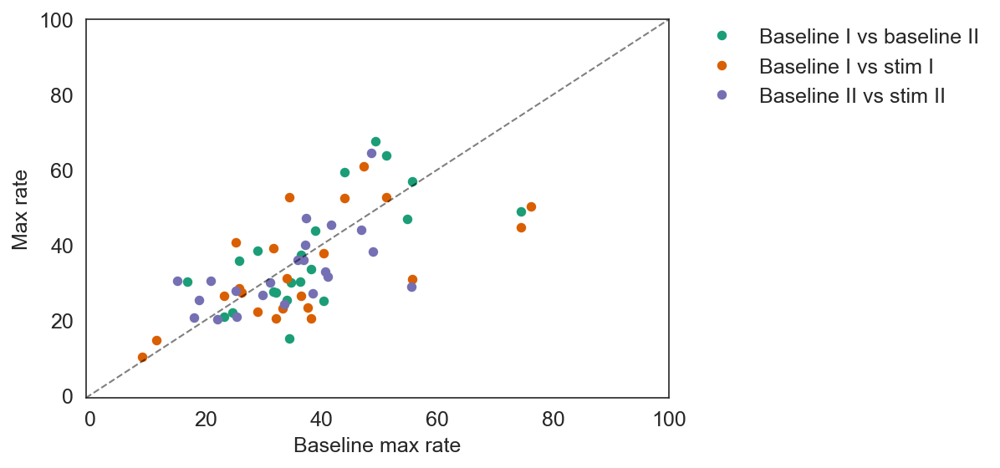

In [29]:
fig = plt.figure()
labels = ['Baseline I vs baseline II', 'Baseline I vs stim I', 'Baseline II vs stim II']
for i, pairs in enumerate(results_maxrate):
    for j, pair in enumerate(pairs):
        plt.plot(*pair, color=cmap[i], marker='.', ls='none', markersize=msize)
#     plt.scatter(*np.array(pairs).T, label=labels[i], color=cmap[i])
# plt.legend(bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
custom_lines = [
    Line2D([],[], color=cmap[i], marker='.', ls='none', label=label, markersize=msize) 
    for i, label in enumerate(labels)
]
plt.legend(handles=custom_lines, bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
plt.ylabel('Max rate')
plt.xlabel('Baseline max rate')
lim = [-.7, 100]
plt.ylim(lim)
plt.xlim(lim)
plt.plot(lim, lim, '--k', alpha=.5, lw=1)
fig.savefig(output_path / 'figures' / 'baseline_max_rate_vs_other.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'baseline_max_rate_vs_other.svg', bbox_inches='tight')

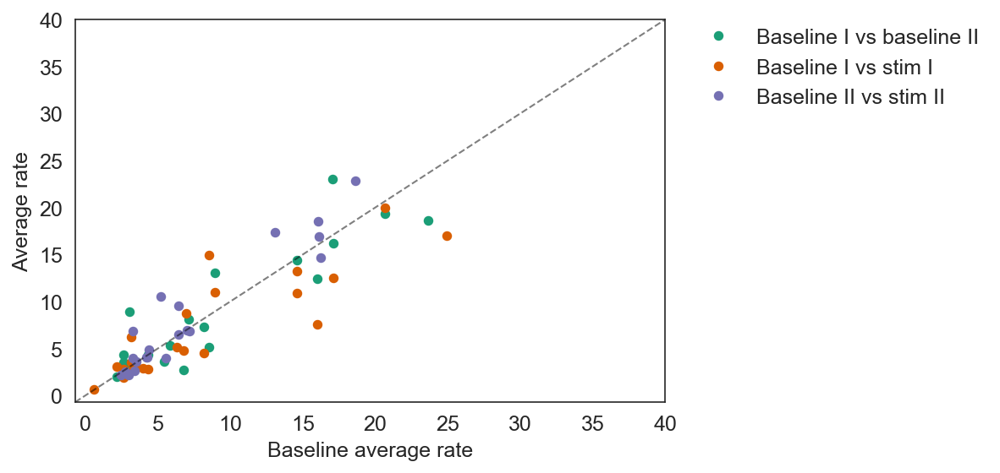

In [30]:
fig = plt.figure()
labels = ['Baseline I vs baseline II', 'Baseline I vs stim I', 'Baseline II vs stim II']
for i, pairs in enumerate(results_avgrate):
    for j, pair in enumerate(pairs):
        plt.plot(*pair, color=cmap[i], marker='.', ls='none', markersize=msize)
#     plt.scatter(*np.array(pairs).T, label=labels[i], color=cmap[i])
# plt.legend(bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
custom_lines = [
    Line2D([],[], color=cmap[i], marker='.', ls='none', label=label, markersize=msize) 
    for i, label in enumerate(labels)
]
plt.legend(handles=custom_lines, bbox_to_anchor=(1.04,1), borderaxespad=0, frameon=False)
plt.ylabel('Average rate')
plt.xlabel('Baseline average rate')
lim = [-.7, 40]
plt.ylim(lim)
plt.xlim(lim)
plt.plot(lim, lim, '--k', alpha=.5, lw=1)
fig.savefig(output_path / 'figures' / 'baseline_average_rate_vs_other.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'baseline_average_rate_vs_other.svg', bbox_inches='tight')

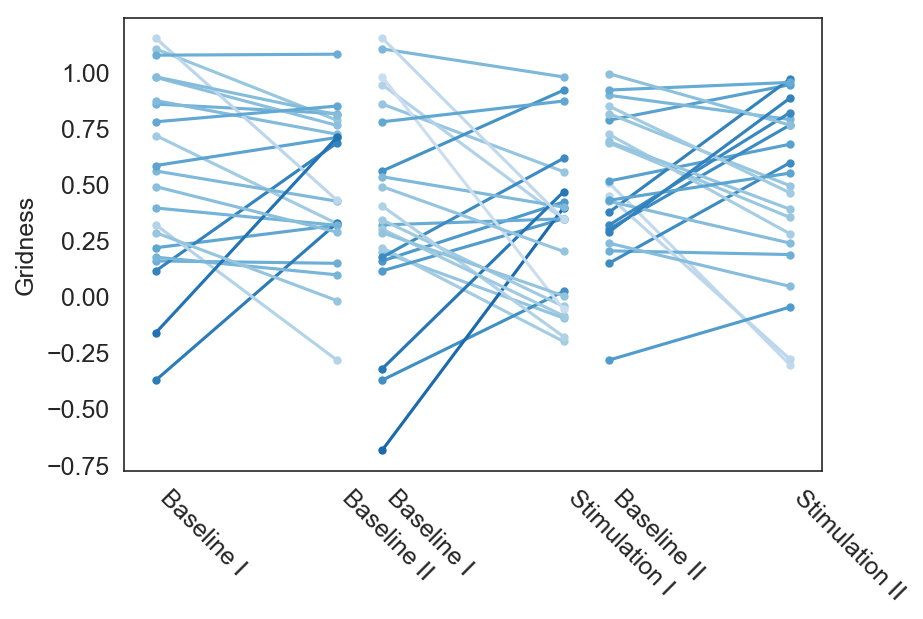

In [31]:
fig = plt.figure()
import matplotlib
cNorm  = matplotlib.colors.Normalize(vmin=-np.pi/2, vmax=np.pi/2)
scalarMap = plt.cm.ScalarMappable(norm=cNorm, cmap=plt.cm.Blues)

ticks = []
for i, pairs in enumerate(results_gridness):
    for j, pair in enumerate(pairs):
        angle = float(np.arctan(np.diff(pair) / 0.9))
        color = scalarMap.to_rgba(angle)
#         color = plt.cm.Paired((np.sign(angle)+1)/14)
        tick = (i, i+.8)
        plt.plot(tick, pair, marker='.', color=color)
    ticks.append(tick)
plt.xticks(
    [t for tick in ticks for t in tick], 
    ['Baseline I', 'Baseline II', 'Baseline I', 'Stimulation I', 'Baseline II', 'Stimulation II'],
    rotation=-45, ha='left'
)
plt.ylabel('Gridness')
fig.savefig(output_path / 'figures' / 'stickplot_gridness.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'stickplot_gridness.svg', bbox_inches='tight')

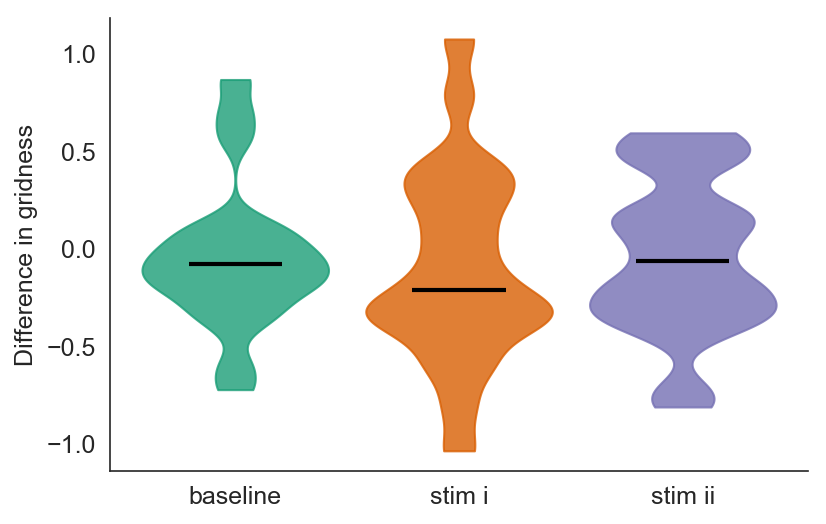

In [32]:
fig = plt.figure()
ticks = [0,0.6,1.2]

diff_res = [[], [], []]
for i, pairs in enumerate(results_gridness):
    for j, pair in enumerate(pairs):
#         if results_unit_id[i][j] in [results_id_map[i] for i in exclude]:
#             continue
        diff_res[i].append(np.diff(pair))
violins = plt.violinplot(
    diff_res, ticks, showmedians=True, showextrema=False, points=1000, bw_method=.2)


for category in ['cbars', 'cmins', 'cmaxes', 'cmedians']:
    if category in violins:
        violins[category].set_color(['k', 'k'])
        violins[category].set_linewidth(2.0)
        
        
colors = plt.cm.Paired(np.linspace(0,1,12))
            
for pc, c in zip(violins['bodies'], cmap):
    pc.set_facecolor(c)
    pc.set_edgecolor(c)
    pc.set_alpha(0.8)
    
plt.xticks(ticks, ['baseline', 'stim i', 'stim ii'])
plt.ylabel('Difference in gridness')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
fig.savefig(output_path / 'figures' / 'violins_gridness_difference.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'violins_gridness_difference.svg', bbox_inches='tight')

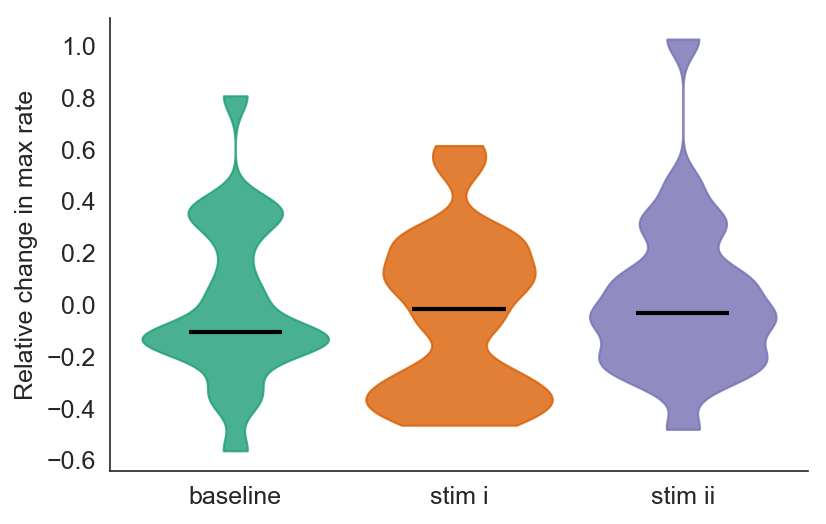

In [33]:
fig = plt.figure()
ticks = [0,0.6,1.2]

diff_res = [[], [], []]
for i, pairs in enumerate(results_maxrate):
    for j, pair in enumerate(pairs):
#         if results_unit_id[i][j] in [results_id_map[i] for i in exclude]:
#             continue
        diff_res[i].append((pair[1] - pair[0]) / pair[0])
violins = plt.violinplot(
    diff_res, ticks, showmedians=True, showextrema=False, points=1000, bw_method=.2)


for category in ['cbars', 'cmins', 'cmaxes', 'cmedians']:
    if category in violins:
        violins[category].set_color(['k', 'k'])
        violins[category].set_linewidth(2.0)
        
        
colors = plt.cm.Paired(np.linspace(0,1,12))
            
for pc, c in zip(violins['bodies'], cmap):
    pc.set_facecolor(c)
    pc.set_edgecolor(c)
    pc.set_alpha(0.8)
    
plt.xticks(ticks, ['baseline', 'stim i', 'stim ii'])
plt.ylabel('Relative change in max rate')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
fig.savefig(output_path / 'figures' / 'violins_max_rate_difference.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'violins_max_rate_difference.svg', bbox_inches='tight')

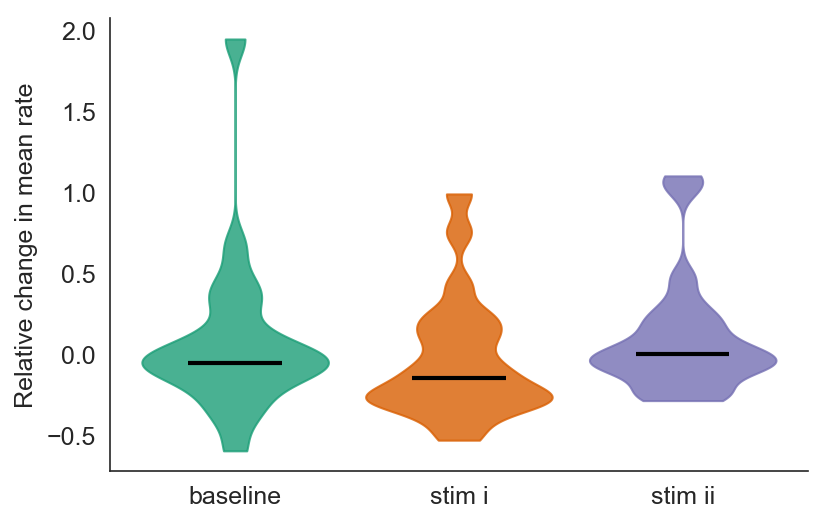

In [34]:
fig = plt.figure()
ticks = [0,0.6,1.2]

diff_res = [[], [], []]
for i, pairs in enumerate(results_avgrate):
    for j, pair in enumerate(pairs):
#         if results_unit_id[i][j] in [results_id_map[i] for i in exclude]:
#             continue
        diff_res[i].append((pair[1] - pair[0]) / pair[0])
violins = plt.violinplot(
    diff_res, ticks, showmedians=True, showextrema=False, points=1000, bw_method=.2)


for category in ['cbars', 'cmins', 'cmaxes', 'cmedians']:
    if category in violins:
        violins[category].set_color(['k', 'k'])
        violins[category].set_linewidth(2.0)
        
        
colors = plt.cm.Paired(np.linspace(0,1,12))
            
for pc, c in zip(violins['bodies'], cmap):
    pc.set_facecolor(c)
    pc.set_edgecolor(c)
    pc.set_alpha(0.8)
    
plt.xticks(ticks, ['baseline', 'stim i', 'stim ii'])
plt.ylabel('Relative change in mean rate')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
fig.savefig(output_path / 'figures' / 'violins_mean_rate_difference.png', bbox_inches='tight')
fig.savefig(output_path / 'figures' / 'violins_mean_rate_difference.svg', bbox_inches='tight')

# CC

In [18]:
n_253 = once_a_gridcell.query('unit_idnum==253').sort_values('action')

In [19]:
def fftcorrelate2d(arr1, arr2, normalize=False, **kwargs):
    from copy import copy
    arr1 = copy(arr1)
    arr2 = copy(arr2)
    from astropy.convolution import convolve_fft
    if normalize:
        # https://stackoverflow.com/questions/53436231/normalized-cross-correlation-in-python
        a_ = arr1.ravel()
        v_ = arr2.ravel()
        arr1 = (arr1 - np.mean(a_)) / (np.std(a_) * len(a_))
        arr2 = (arr2 - np.mean(v_)) / np.std(v_)
    corr = convolve_fft(arr1, np.fliplr(np.flipud(arr2)), normalize_kernel=False, **kwargs)
    return corr

In [20]:
n1 = n_253.iloc[0]
n2 = n_253.iloc[1]
n3 = n_253.iloc[2]
n4 = n_253.iloc[3]

In [21]:
r1 = data_loader.rate_map(n1.action, n1.channel_group, n1.unit_name, smoothing=smoothing_low)
r2 = data_loader.rate_map(n2.action, n2.channel_group, n2.unit_name, smoothing=smoothing_low)
r3 = data_loader.rate_map(n3.action, n3.channel_group, n3.unit_name, smoothing=smoothing_low)
r4 = data_loader.rate_map(n4.action, n4.channel_group, n4.unit_name, smoothing=smoothing_low)

In [22]:
r12 = fftcorrelate2d(r1, r2)
r13 = fftcorrelate2d(r1, r3)
r14 = fftcorrelate2d(r1, r4)

In [23]:
from scipy import ndimage

In [24]:
bc = ndimage.center_of_mass(r12)

In [25]:
bc

(24.88272779048673, 25.36160286569858)

In [62]:
from spatial_maps.fields import find_peaks, calculate_field_centers, separate_fields_by_laplace

In [64]:

def cross_correlation_distance(r1, r2):
    r12 = fftcorrelate2d(r1, r2)
    labels = separate_fields_by_laplace(r12, threshold=0)
    peaks = calculate_field_centers(r12, labels)
    centered_peaks = peaks - np.array(r1.shape) / 2
    offset = np.linalg.norm(centered_peaks, axis=1)
    distance_idx = np.argmin(offset)
    distance = offset[distance_idx]
    angle = np.arctan2(*centered_peaks[distance_idx])
    
    return distance, angle

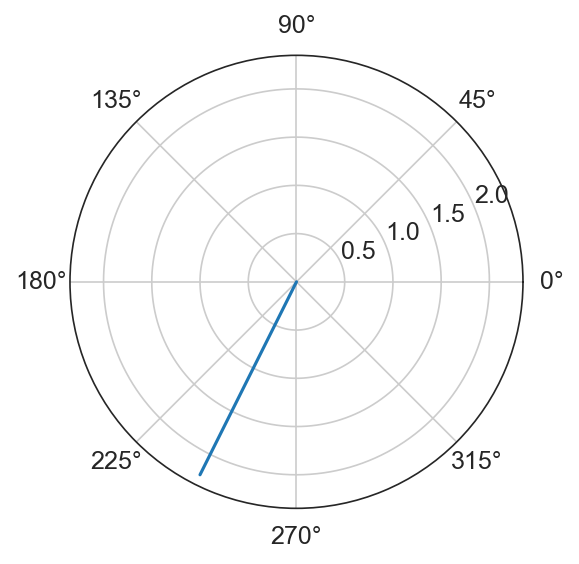

In [109]:
plt.polar([0, angle], [0, distance])

(20, 30)

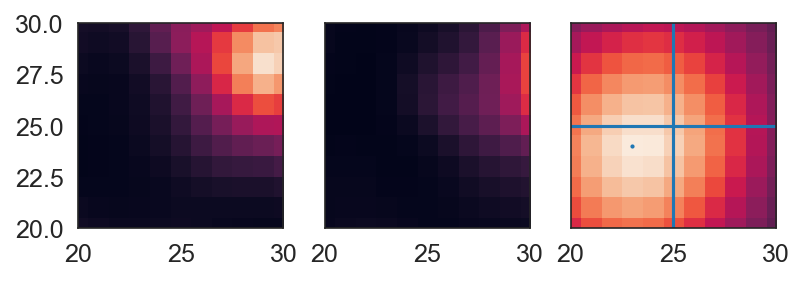

In [110]:
fig, axs = plt.subplots(1, 3, sharex=True, sharey=True)
axs[0].imshow(r1)
axs[1].imshow(r2)
axs[2].imshow(r12)
axs[2].axvline(25)
axs[2].axhline(25)

# plt.scatter(*simple_peaks.T)
plt.scatter(*peaks[0], s=1)
plt.xlim(20, 30)
plt.ylim(20, 30)

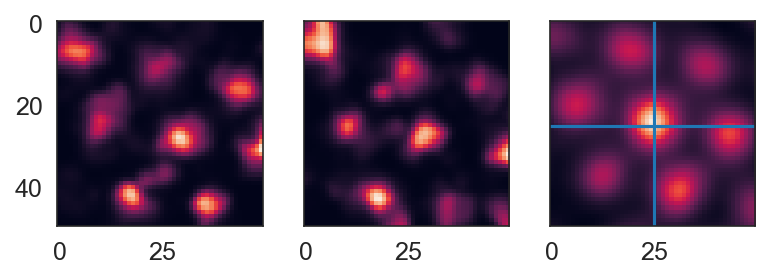

In [39]:
fig, axs = plt.subplots(1, 3, sharex=True, sharey=True)
axs[0].imshow(r1)
axs[1].imshow(r3)
axs[2].imshow(r13)
axs[2].axvline(25)
axs[2].axhline(25)

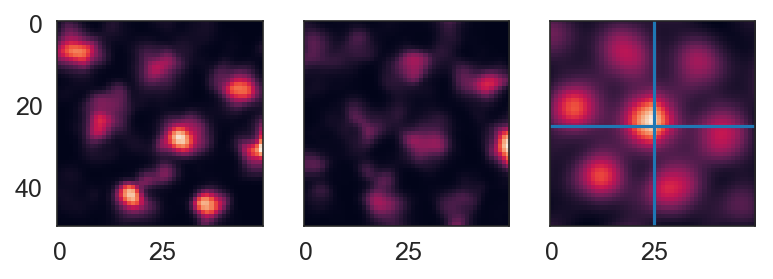

In [40]:
fig, axs = plt.subplots(1, 3, sharex=True, sharey=True)
axs[0].imshow(r1)
axs[1].imshow(r4)
axs[2].imshow(r14)
axs[2].axvline(25)
axs[2].axhline(25)

# Save to expipe

In [29]:
action = project.require_action("longitudinal-comparisons-gridcells")

In [30]:
copy_tree(output_path, str(action.data_path()))

['/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_157_rate_map.png',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_629_rate_map.svg',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_317_rate_map.png',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_79_spike_map.svg',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_233_rate_map.png',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_79_rate_map.svg',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_121_rate_map.svg',
 '/media/storage/expipe/septum-mec/actions/longitudinal-comparisons-gridcells/data/figures/neuron_196_rate_map.png',
 '/media/storage/expipe/septum-mec/actions/longitudinal-compariso

In [31]:
septum_mec.analysis.registration.store_notebook(action, "20_longitudinal_comparisons_gridcells.ipynb")